[holoviews showcase](http://holoviews.org/Tutorials/Showcase.html)

In [2]:
import holoviews as hv
import numpy as np
hv.notebook_extension()

In [3]:
def sine(x, phase=0, freq=100):
    return np.sin((freq * x + phase))

In [4]:
phases = np.linspace(0,2*np.pi,11) # Explored phases
freqs = np.linspace(50,150,5)      # Explored frequencies

In [5]:
dist = np.linspace(-0.5,0.5,202)   # Linear spatial sampling
x,y = np.meshgrid(dist, dist)
grid = (x**2+y**2)                 # 2D spatial sampling

:Layout
   .Image.I   :Image   [x,y]   (z)
   .Curve.I   :Curve   [x]   (y)
   .Image.II  :Image   [x,y]   (z)
   .Curve.III :Curve   [x]   (y)
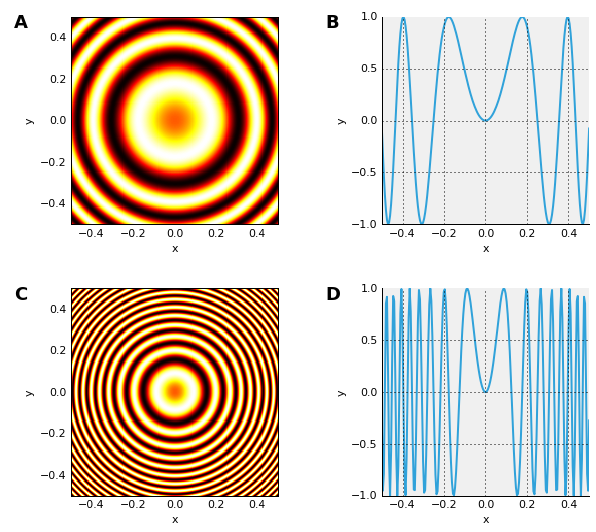

In [6]:
freq1 = hv.Image(sine(grid, freq=50))  + hv.Curve(zip(dist, sine(dist**2, freq=50)))
freq2 = hv.Image(sine(grid, freq=200)) + hv.Curve(zip(dist, sine(dist**2, freq=200)))
(freq1 + freq2).cols(2)

In [7]:
dimensions = ['Phase', 'Frequency']
keys = [(p,f) for p in phases for f in freqs]

b':HoloMap   [Phase,Frequency]\n   :Image   [x,y]   (Amplitude)'
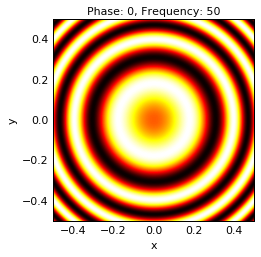
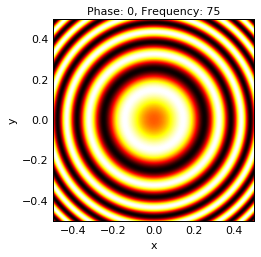
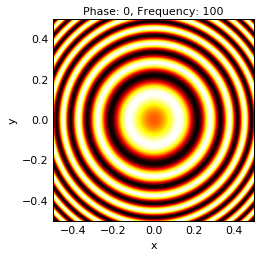
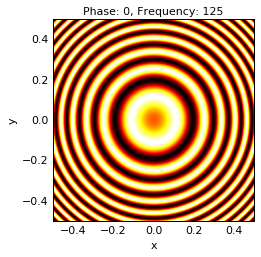
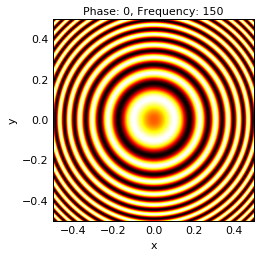
...
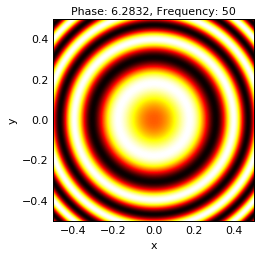
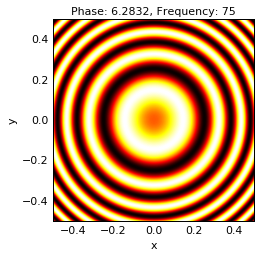
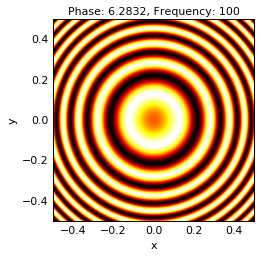
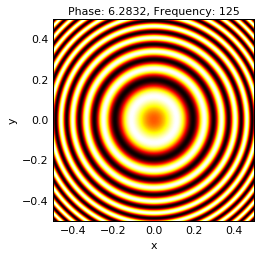
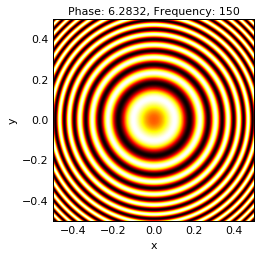

In [8]:
items = [(k, hv.Image(sine(grid, *k), vdims=['Amplitude'])) for k in keys]
circular_wave = hv.HoloMap(items, kdims=dimensions)
circular_wave

:Layout
   .HoloMap.I  :HoloMap   [Phase,Frequency]
      :Image   [x,y]   (Amplitude)
   .HoloMap.II :HoloMap   [Phase,Frequency]
      :Curve   [x]   (y)
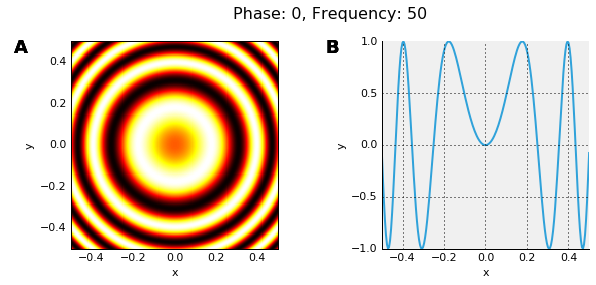
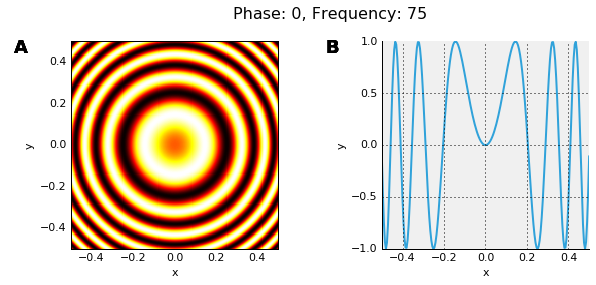
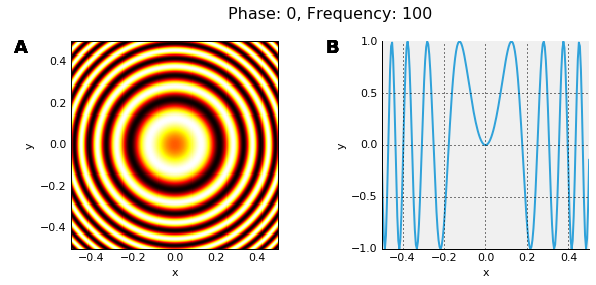
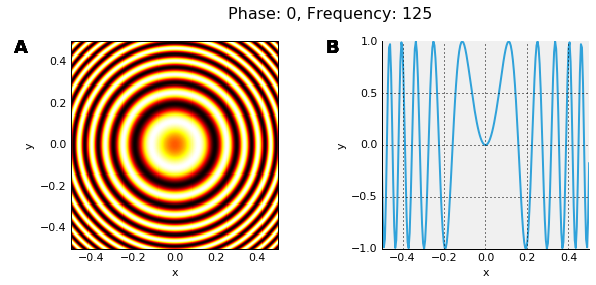
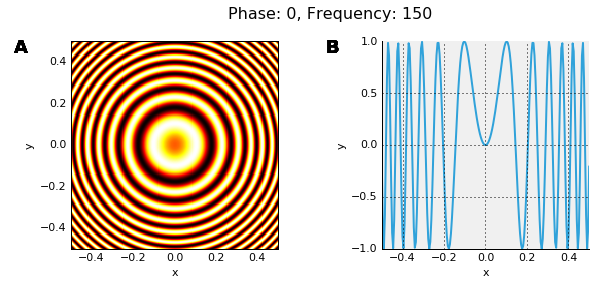
...
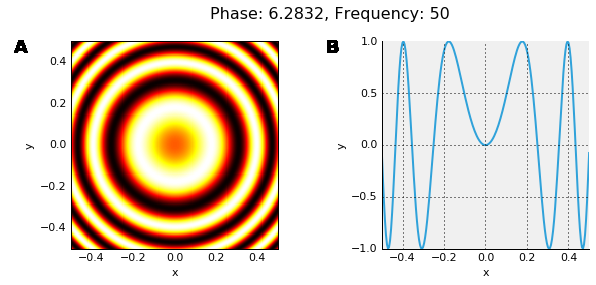
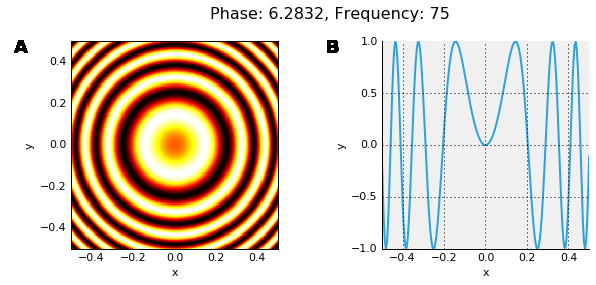
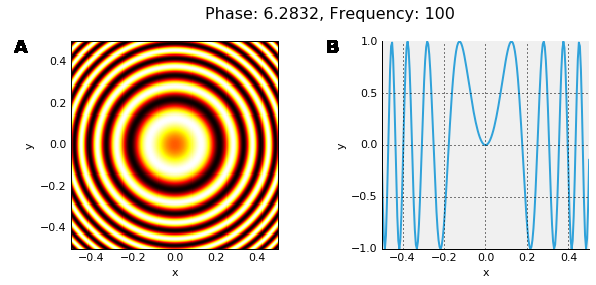
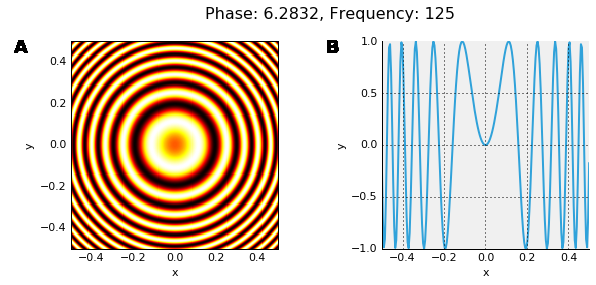
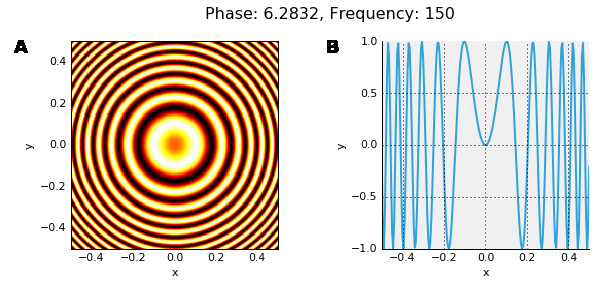

In [9]:
items = [(k, hv.Curve(zip(dist, sine(dist**2, *k)))) for k in keys]
sections = hv.HoloMap(items, kdims=dimensions)
circular_wave + sections

:Layout
   .HoloMap.I  :HoloMap   [Phase,Frequency]
      :Overlay
         .Image.I  :Image   [x,y]   (Amplitude)
         .Points.I :Points   [x,y]
   .HoloMap.II :HoloMap   [Frequency]
      :Curve   [Phase]   (Amplitude)
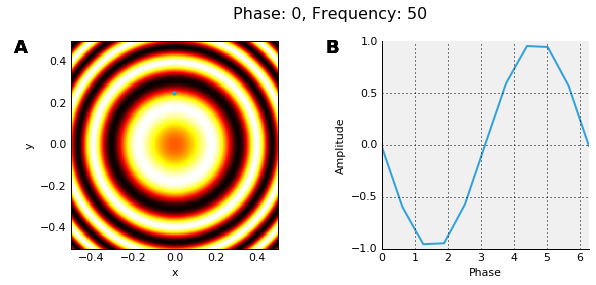
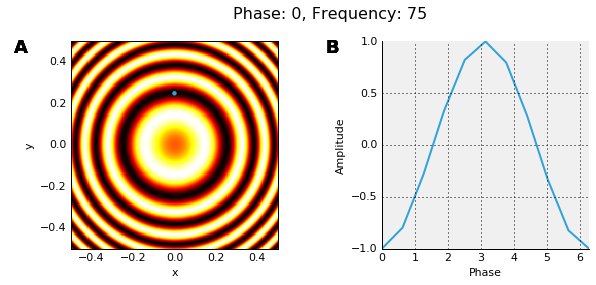
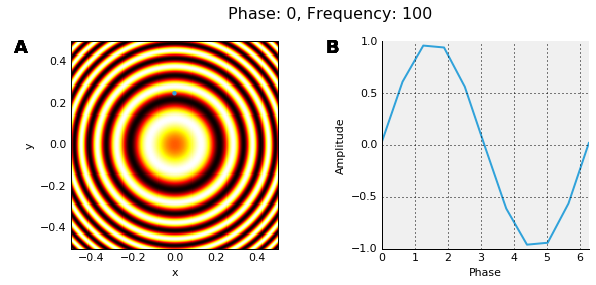
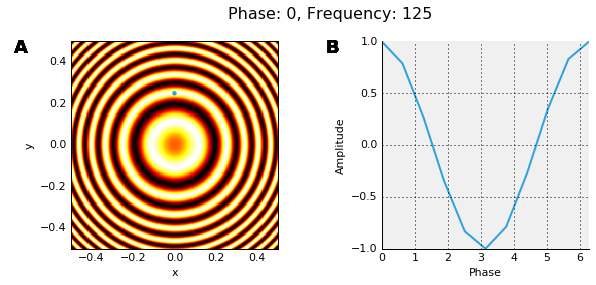
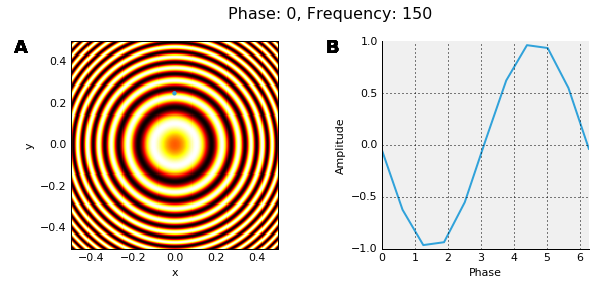
...
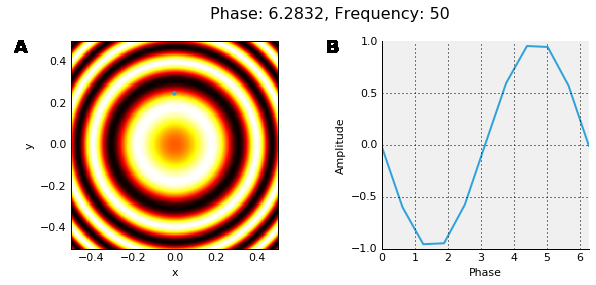
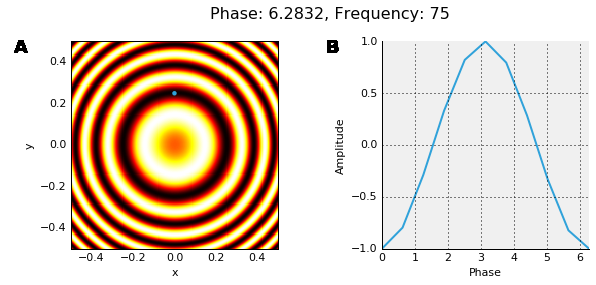
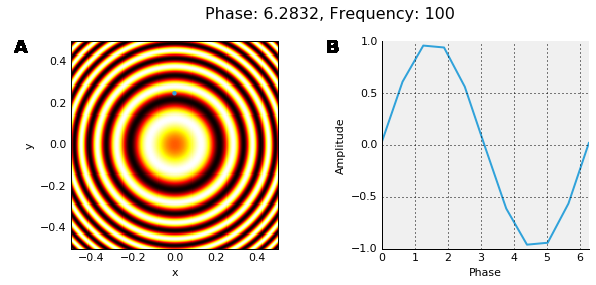
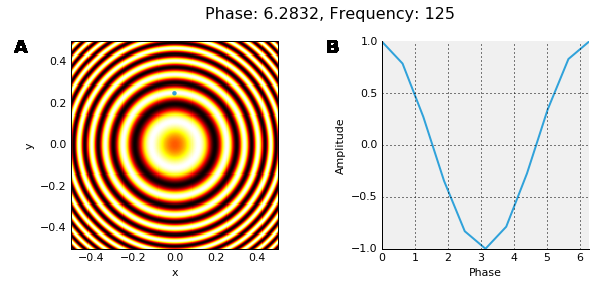
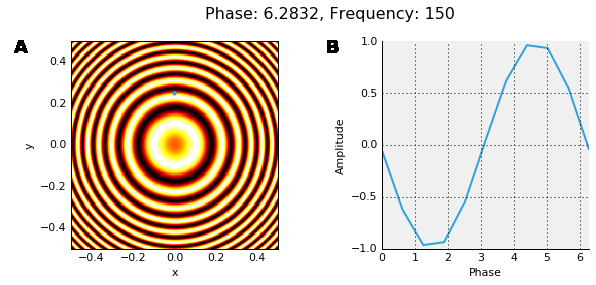

In [10]:
sample_pos = (0,0.25)
annotated = circular_wave * hv.Points([sample_pos])
sample = circular_wave.sample(samples=[sample_pos]).to.curve('Phase', 'Amplitude', ['Frequency'])
annotated + sample

In [14]:
# %output holomap='gif'

In [15]:
%%opts Image (cmap='gray') Contours (color='r')
from holoviews.operation import contours, threshold, gradient
m = hv.HoloMap([(p, hv.Image(sine(grid, phase=p))) for p in phases], kdims=['Phase'])
contours(m, levels=[0.5]) + threshold(m, level=0.5) + gradient(m).hist(bin_range=(0,0.7))

C:\Anaconda3\lib\site-packages\matplotlib\animation.py:782: UserWarning: MovieWriter imagemagick unavailable
  warnings.warn("MovieWriter %s unavailable" % writer)


ValueError: Cannot save animation: no writers are available. Please install mencoder or ffmpeg to save animations.

:Layout
   .Overlay.I   :HoloMap   [Phase]
      :Overlay
         .Image.I :Image   [x,y]   (z)
         .Level.I :NdOverlay   [Levels]
            :Contours   [x,y]   (z)
   .Threshold.I :HoloMap   [Phase]
      :Image   [x,y]   (z)
   .Gradient.I  :AdjointLayout
      :HoloMap   [Phase]
         :Histogram   [z]   (Frequency)
      :HoloMap   [Phase]
         :Image   [x,y]   (z)